In [1]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
books_df = pd.read_csv("../webscrape/combined_books.csv")
ratings_df = pd.read_csv("../Ratings.csv")
users_df = pd.read_csv("../Users.csv")

In [2]:
books_df.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,Provides an introduction to classical myths pl...,Social Science,en,An excellent primer on classical mythology for...,"Classical Mythology, Mythology, Classical, Myt...",English
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,"Here, for the first time in paperback, is an o...",History,en,Not found,"Campaigns, History, History, Military, Militar...",English
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,"""Scientists have recently discovered shards of...",Medical,en,"""Scientists have recently discovered shards of...","Influenza, History, Grippe humaine, Disease Ou...",English
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,A look at the incredibly well-preserved ancien...,Design,en,"In the museums of Urumchi, the wind-swept regi...","Antiquities, Bronze age, Mummies, Prehistoric ...",English


In [3]:
missing_values = books_df.isnull().sum()
missing_values

ISBN                           0
Book-Title                     0
Book-Author                    0
Year-Of-Publication            0
Publisher                      0
Description                12069
Categories                  5069
Language                       0
openlibrary_Description       89
openlibrary_Categories     11333
openlibrary_Language          88
dtype: int64

In [4]:
# 填充 Description 和 openlibrary_Description 列
books_df['Description'] = books_df['Description'].fillna(books_df['openlibrary_Description'])
books_df['openlibrary_Description'] = books_df['openlibrary_Description'].fillna(books_df['Description'])

# 删除同时 Description 和 openlibrary_Description 都为空的行
books_df = books_df.dropna(subset=['Description', 'openlibrary_Description'], how='all')

In [5]:
# 填充 Description 和 openlibrary_Description 列
books_df['Categories'] = books_df['Categories'].fillna(books_df['openlibrary_Categories'])
books_df['openlibrary_Categories'] = books_df['openlibrary_Categories'].fillna(books_df['Categories'])

# 删除同时 Description 和 openlibrary_Description 都为空的行
books_df = books_df.dropna(subset=['Categories', 'openlibrary_Categories'], how='all')

In [6]:
books_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,Provides an introduction to classical myths pl...,Social Science,en,An excellent primer on classical mythology for...,"Classical Mythology, Mythology, Classical, Myt...",English
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,"Here, for the first time in paperback, is an o...",History,en,Not found,"Campaigns, History, History, Military, Militar...",English
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,"""Scientists have recently discovered shards of...",Medical,en,"""Scientists have recently discovered shards of...","Influenza, History, Grippe humaine, Disease Ou...",English
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,A look at the incredibly well-preserved ancien...,Design,en,"In the museums of Urumchi, the wind-swept regi...","Antiquities, Bronze age, Mummies, Prehistoric ...",English
...,...,...,...,...,...,...,...,...,...,...,...
83575,0201039400,Electrical engineering: Concepts and applicati...,A. Bruce Carlson,1981,Addison-Wesley,Not found,Technology & Engineering,en,Not found,"Electric engineering, Electrical engineering",English
83576,0761533338,Your First Year as a Nurse: Making the Transit...,DONNA RN CARDILLO,2001,Prima Lifestyles,Survive and Thrive As a Nurse from Day One! We...,Business & Economics,en,Not found,"Nursing, Professional Competence, Philosophy, ...",English
83577,0275939618,Unarmed Against Hitler,Jacques Semelin,1993,Praeger Paperback,Examines the resistance to Nazi occupation in ...,History,en,Not found,"Politics and government, Nonviolence, Protest ...",English
83578,0810941511,Handmade Baby Gifts,Teresa Layman,1999,Harry N Abrams Inc,Presents projects with instructions and patter...,Infants' supplies,en,Not found,Infants' supplies,English


In [7]:
books_df.to_csv('books_processed.csv', index=False)

In [8]:
missing_values = books_df.isnull().sum()
missing_values

ISBN                        0
Book-Title                  0
Book-Author                 0
Year-Of-Publication         0
Publisher                   0
Description                 0
Categories                  0
Language                    0
openlibrary_Description     0
openlibrary_Categories      0
openlibrary_Language       79
dtype: int64

In [9]:
books_df.loc[books_df["Year-Of-Publication"] == 'DK Publishing Inc',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language


In [10]:
#ISBN '0789466953'
books_df.loc[books_df["ISBN"] == '0789466953','Year-Of-Publication'] = 2000
books_df.loc[books_df["ISBN"] == '0789466953','Book-Author'] = "James Buckley"
books_df.loc[books_df["ISBN"] == '0789466953','Publisher'] = "DK Publishing Inc"
books_df.loc[books_df["ISBN"] == '0789466953','Book-Title'] = "DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)"

#ISBN '078946697X'
books_df.loc[books_df["ISBN"] == '078946697X','Year-Of-Publication'] = 2000
books_df.loc[books_df["ISBN"] == '078946697X','Book-Author'] = "Michael Teitelbaum"
books_df.loc[books_df["ISBN"] == '078946697X','Publisher'] = "DK Publishing Inc"
books_df.loc[books_df["ISBN"] == '078946697X','Book-Title'] = "DK Readers: Creating the X-Men, How It All Began (Level 4: Proficient Readers)"

#rechecking
books_df.loc[(books_df["ISBN"] == '0789466953') | (books_df["ISBN"] == '078946697X'),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language


In [11]:
books_df.loc[books_df["Year-Of-Publication"] == 'Gallimard',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language


In [12]:
books_df.loc[books_df["ISBN"] == '2070426769','Year-Of-Publication'] = 2003
books_df.loc[books_df["ISBN"] == '2070426769','Book-Author'] = "Jean-Marie Gustave Le ClÃ?Â©zio"
books_df.loc[books_df["ISBN"] == '2070426769','Publisher'] = "Gallimard"
books_df.loc[books_df["ISBN"] == '2070426769','Book-Title'] = "Peuple du ciel, suivi de 'Les Bergers"


books_df.loc[books_df["ISBN"] == '2070426769',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language


In [13]:
ratings_df.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [14]:
users_df.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [15]:
import numpy as np


new_user_data = {'User-ID': 279858, 'Location': "kensington, nsw, australia", 'Age': 38}

# Append the new user to the DataFrame
users_df = pd.concat([users_df, pd.DataFrame([new_user_data])], ignore_index=True)

# List of ISBNs to be rated by the new user
isbn_list = [
    '0425176428', '0385418493', '0871137380', '0486265862', '0060973129',
    '0029087104', '0553256696', '0393038440', '0345308239', '0131337033', 
]

# Generate random high ratings (6-10)
ratings_list = np.random.randint(6, 11, size=len(isbn_list))

# Create new user ratings
new_user_ratings = [{'User-ID': 279858, 'ISBN': isbn, 'Book-Rating': rating} for isbn, rating in zip(isbn_list, ratings_list)]

ratings_df = pd.concat([ratings_df, pd.DataFrame(new_user_ratings)], ignore_index=True)

In [16]:
merged_df = pd.merge(books_df, ratings_df, on='ISBN')
merged_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language,User-ID,Book-Rating
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,Provides an introduction to classical myths pl...,Social Science,en,An excellent primer on classical mythology for...,"Classical Mythology, Mythology, Classical, Myt...",English,2,0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,8,5
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,11400,0
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,11676,8
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,41385,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
703553,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,41842,7
703554,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,177432,10
703555,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,185384,0
703556,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,203240,0


In [17]:
final_df = pd.merge(merged_df, users_df, on='User-ID')
final_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language,User-ID,Book-Rating,Location,Age
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,Provides an introduction to classical myths pl...,Social Science,en,An excellent primer on classical mythology for...,"Classical Mythology, Mythology, Classical, Myt...",English,2,0,"stockton, california, usa",18.0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,8,5,"timmins, ontario, canada",NaN
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,11400,0,"ottawa, ontario, canada",49.0
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,11676,8,"n/a, n/a, n/a",NaN
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,41385,0,"sudbury, ontario, canada",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
703553,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,41842,7,"st. charles, missouri, usa",NaN
703554,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,177432,10,"wichita, kansas, usa",33.0
703555,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,185384,0,"st. charles, missouri, usa",NaN
703556,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,203240,0,"st. louis, missouri, usa",32.0


In [18]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 703558 entries, 0 to 703557
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   ISBN                     703558 non-null  object 
 1   Book-Title               703558 non-null  object 
 2   Book-Author              703558 non-null  object 
 3   Year-Of-Publication      703558 non-null  int64  
 4   Publisher                703558 non-null  object 
 5   Description              703558 non-null  object 
 6   Categories               703558 non-null  object 
 7   Language                 703558 non-null  object 
 8   openlibrary_Description  703558 non-null  object 
 9   openlibrary_Categories   703558 non-null  object 
 10  openlibrary_Language     703210 non-null  object 
 11  User-ID                  703558 non-null  int64  
 12  Book-Rating              703558 non-null  int64  
 13  Location                 703558 non-null  object 
 14  Age 

### Data Visualization

First, 1000 samples were randomly selected from the original data final_df, and then the pd.cut() function was used to divide the book ratings into three categories: low, medium, and high ratings. This can help us better understand how authors perform at different rating levels.This visualization allows us to visually see the average rating levels of different authors and compare them according to rating categories. This is very helpful for understanding how authors behave under different levels of popularity in the book recommendation system.

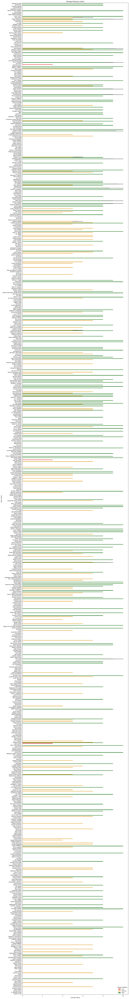

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

sample_size = 1000
df1 = final_df.sample(n=sample_size, random_state=42)

df1['Rating_Category'] = pd.cut(df1['Book-Rating'], bins=[0, 3, 7, 10], labels=['Low', 'Medium', 'High'])

# Barplot using seaborn
plt.figure(figsize=(16, 150))
sns.barplot(data=df1, x='Book-Rating', y='Book-Author', hue='Rating_Category', palette={'Low': 'red', 'Medium': 'orange', 'High': 'green'})
plt.title('Average Rating by Author')
plt.xlabel('Average Rating')
plt.ylabel('Book-Author')
plt.legend(title='Rating Category')
plt.show()

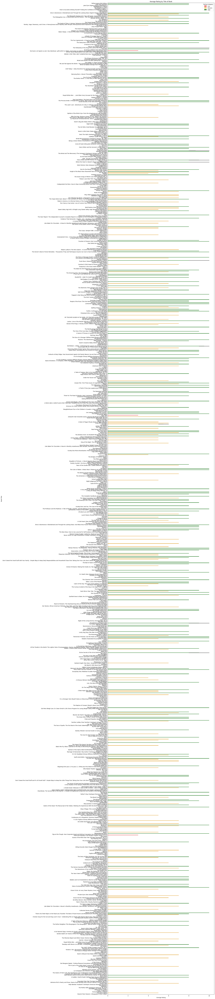

In [20]:
sample_size = 1000
df2 = final_df.sample(n=sample_size, random_state=42)


df2['Rating_Category'] = pd.cut(df2['Book-Rating'], bins=[0, 3, 7, 10], labels=['Low', 'Medium', 'High'])

# Plotting bar plot dengan seaborn
plt.figure(figsize=(16, 150))
sns.barplot(data=df2, x='Book-Rating', y='Book-Title', hue='Rating_Category', palette={'Low': 'red', 'Medium': 'orange', 'High': 'green'})
plt.title('Average Rating by Title of Book')
plt.xlabel('Average Rating')
plt.ylabel('Book-Title')
plt.legend(title='Rating Category')
plt.show()

In [21]:
missing_values = final_df.isnull().sum()
missing_values

ISBN                            0
Book-Title                      0
Book-Author                     0
Year-Of-Publication             0
Publisher                       0
Description                     0
Categories                      0
Language                        0
openlibrary_Description         0
openlibrary_Categories          0
openlibrary_Language          348
User-ID                         0
Book-Rating                     0
Location                        0
Age                        193323
dtype: int64

It shows the trend of the volume of books published in different years. We can clearly see that some years have significantly more publications than others, this may reflect some significant publishing event or socio-cultural change.

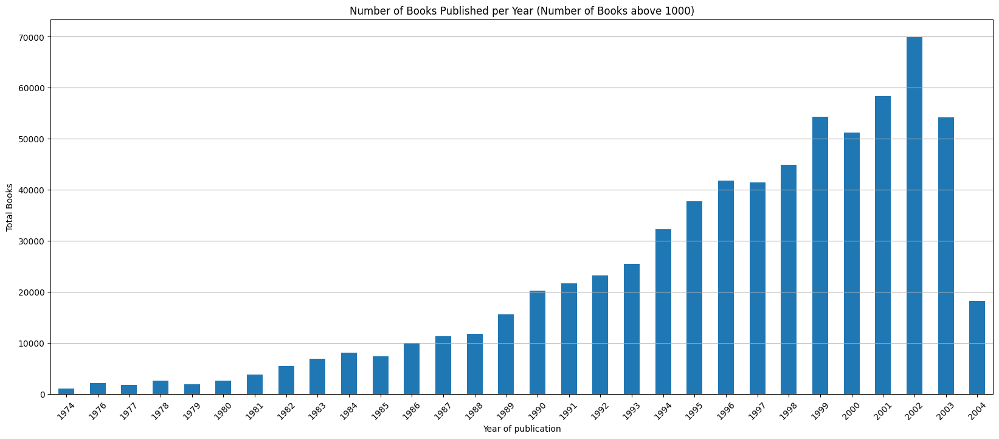

In [22]:
final_df['Year-Of-Publication'] = final_df['Year-Of-Publication'].astype(int)


select_years = final_df[final_df['Year-Of-Publication'] > 0]['Year-Of-Publication']
books_filtered = select_years.value_counts()
books_filtered = books_filtered[books_filtered > 1000]
books_filtered = books_filtered.sort_index(ascending=True)


plt.figure(figsize=(20, 8))
books_filtered.plot(kind='bar')
plt.title('Number of Books Published per Year (Number of Books above 1000)')
plt.xlabel('Year of publication')
plt.ylabel('Total Books')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

This visualization shows the top 10 most prolific authors in the book industry.The author with the highest number of books is Agatha Christie, with around 250 books. The next highest author is Stephen King, with around 225 books. The rest of the authors have a decreasing number of books, with the least prolific being Piers Anthony with around 50 books.

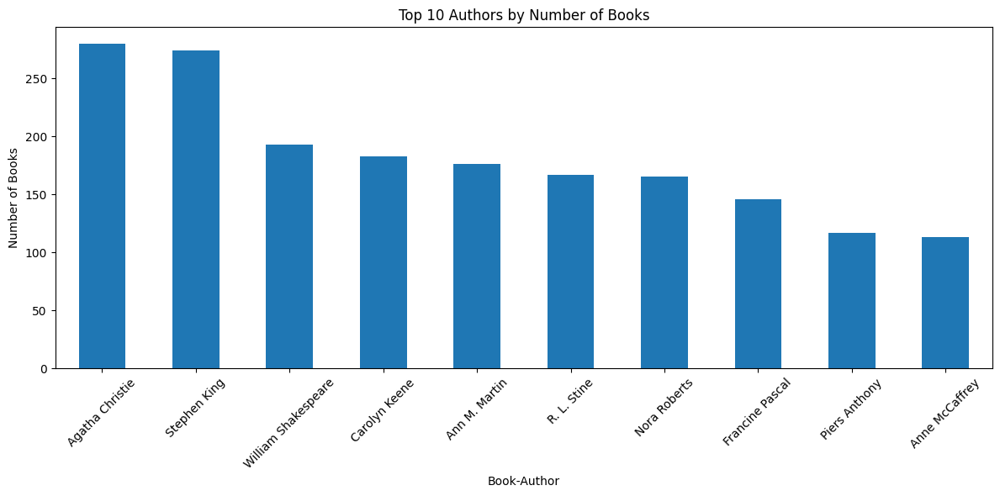

In [23]:
book_author_counts = books_df.groupby('Book-Author')['Book-Title'].count()

sorted_book_authors = book_author_counts.sort_values(ascending=False)

# Select the top 10 authors
top_10_book_authors = sorted_book_authors.head(10)

# The plot of the top 10 authors and the books written by the authors, then calculated using a bar plot
plt.figure(figsize=(12, 6))
top_10_book_authors.plot(kind='bar')
plt.xlabel('Book-Author')
plt.ylabel('Number of Books')
plt.title('Top 10 Authors by Number of Books')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

This distribution plot provides a visual representation of the age distribution of the users in the dataset. It shows that the majority of users are in the 20-40 age range, with a peak around the late 20s to early 30s. 
The distribution then tapers off as the age increases, with fewer users in the older age ranges.

In [24]:
def plot_distribution(feature, data):
    sns.displot(x=feature, data=data, kde=True, color='#4169E1')
    plt.figtext(0.2, 1, '%s Distribution'%feature, fontfamily='sans-serif', fontsize=13)

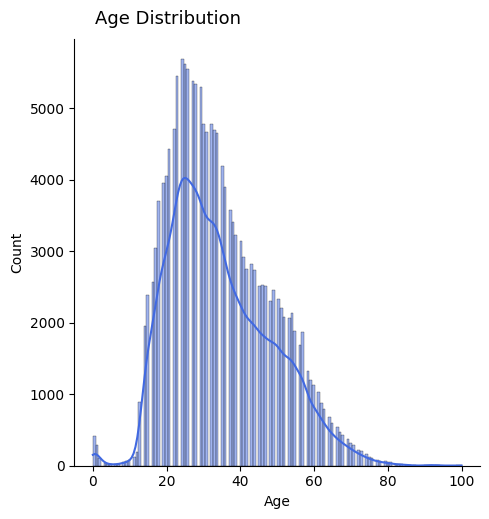

In [25]:
df_plot = users_df[users_df['Age']<=100]
plot_distribution('Age', df_plot)

This distribution plot provides a visual representation of the publication year distribution of the books in the dataset. It shows a gradually increasing number of books published over the years, with a significant increase starting in the 1990s and peaking in the early 2000s. The distribution then tapers off towards more recent years.

In [26]:
books_df['Year-Of-Publication'] = pd.to_numeric(books_df['Year-Of-Publication'])

In [2]:
df_plot2 = books_df[(books_df['Year-Of-Publication']>1900) & (books_df['Year-Of-Publication']<=2020)]
plot_distribution('Year-Of-Publication', df_plot2)

NameError: name 'plot_distribution' is not defined

This plot provides a visual representation of the distribution of explicit book ratings in the dataset. The distribution appears to be right-skewed, with the majority of ratings being in the 5-10 range, and a small number of lower ratings. This suggests that the books in the dataset tend to have relatively high ratings overall.

In [28]:
ratings = ratings_df[ratings_df.ISBN.isin(books_df.ISBN)]
ratings_explicit = ratings[ratings['Book-Rating'] != 0]
ratings_implicit = ratings[ratings['Book-Rating'] == 0]

<Axes: xlabel='Book-Rating', ylabel='count'>

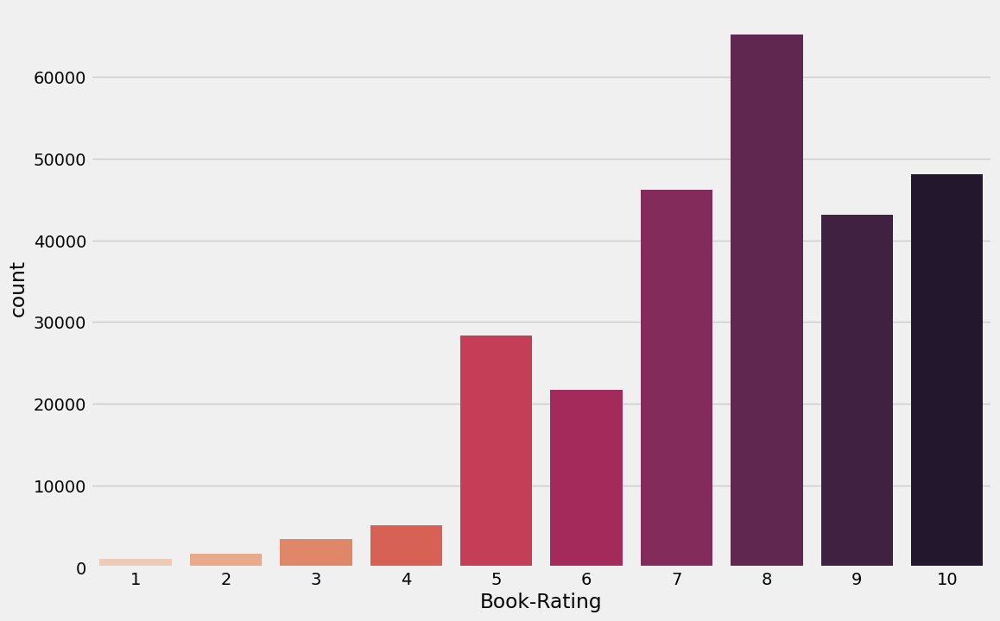

In [29]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(12, 8))
sns.countplot(data=ratings_explicit , x='Book-Rating', palette='rocket_r')

Top 20 Highest Rated Books
weighted rating = (v/(v+m))*R + (m/(v+m))*C`
where:
- `v` is the number of ratings for the book
- `R` is the average rating for the book
- `m` is the 99th percentile of the rating count distribution
- `C` is the mean rating across all books

In [30]:
#Top 20 Highest Rated Books
data = ratings_df.groupby('ISBN').agg(['mean', 'count'])['Book-Rating'].reset_index()


m = data['count'].quantile(0.99) # Keep only books that are rated more than this value
data = data[data['count']>m]
print('m =', m)
print(data.shape)
R = data['mean'] # average for the book rating
v = data['count'] # number of votes for the book = (votes)
C = data['mean'].mean() # mean vote across all books
data['weighted rating'] = (v/(v+m))*R + (m/(v+m))*C
data = data.sort_values('weighted rating', ascending=False).reset_index(drop=True)


data = pd.merge(data, books_df, on='ISBN')[['Book-Title', 'Book-Author', 'mean', 'count', 'weighted rating', 
                              'Year-Of-Publication']].drop_duplicates('Book-Title').iloc[:20]
data

m = 36.0
(3306, 3)


,Book-Title,Book-Author,mean,count,weighted rating,Year-Of-Publication
0,Harry Potter and the Goblet of Fire (Book 4),J. K. Rowling,6.541237,194,5.985290,2000
1,Harry Potter and the Chamber of Secrets (Book 2),J. K. Rowling,6.611765,170,5.978721,1999
2,Free,Paul Vincent,7.962963,54,5.973518,2003
3,Harry Potter and the Prisoner of Azkaban (Book 3),J. K. Rowling,6.467005,197,5.929685,1999
4,Harry Potter and the Sorcerer's Stone (Book 1),J. K. Rowling,6.363095,168,5.767728,1998
5,Harry Potter and the Order of the Phoenix (Boo...,J. K. Rowling,5.571856,334,5.320585,2003
6,The Fellowship of the Ring (The Lord of the Ri...,J. R. R. Tolkien,6.206349,63,5.036531,1999
7,Griffin &amp; Sabine: An Extraordinary Corresp...,Nick Bantock,6.041667,72,5.024228,1991
9,Falling Up,Shel Silverstein,6.921053,38,5.008333,1996
10,The Stand (The Complete and Uncut Edition),Stephen King,6.175439,57,4.942114,1990


In [31]:
import pandas as pd

# Drop duplicate books based on 'Book-Author' and 'Book-Title'
books_df = books_df.drop_duplicates(['Book-Author', 'Book-Title'])

# Merge books and ratings dataframes on 'ISBN'
data = pd.merge(books_df, ratings_df, on='ISBN')[['Book-Author', 'Book-Rating', 'Book-Title', 'ISBN']]

# Group by 'Book-Author' and aggregate mean and count of 'Book-Rating'
data = data.groupby('Book-Author').agg({'Book-Rating': ['mean', 'count']}).reset_index()
data.columns = ['Book-Author', 'mean', 'count']  # Flatten MultiIndex columns

# Determine the threshold for number of votes
m = data['count'].quantile(0.99)
data = data[data['count'] > m]

print('m =', m)
print(data.shape)

# Calculate weighted rating
R = data['mean']  # Average rating for the author
v = data['count']  # Number of votes for the author
C = data['mean'].mean()  # Mean vote across all authors
data['weighted rating'] = (v / (v + m)) * R + (m / (v + m)) * C

# Sort by weighted rating and reset index
data = data.sort_values('weighted rating', ascending=False).reset_index(drop=True)

# Display top 20 highest rated authors
print(data.head(20))

m = 287.34999999999854
(345, 3)
            Book-Author      mean  count  weighted rating
0         J. K. Rowling  5.423298   2086         5.125882
1      J. R. R. Tolkien  5.530499    541         4.641169
2        Bill Watterson  5.534351    524         4.625023
3             Dr. Seuss  5.327103    321         4.212234
4        J.R.R. TOLKIEN  4.505629    977         4.155900
5            Harper Lee  4.933661    407         4.119698
6          Alice Sebold  4.252822   1772         4.073379
7           Neil Gaiman  4.342513   1162         4.069764
8           C. S. Lewis  4.392065    857         4.034179
9         George Orwell  4.602128    470         3.981663
10          Gary Larson  4.470588    595         3.980861
11          Mitch Albom  4.506518    537         3.969810
12        J.D. Salinger  4.487713    529         3.952364
13            Dan Brown  4.046154   2015         3.911444
14        Michael Moore  4.296124    645         3.886429
15        Anita Diamant  4.172539    823

# Data Preprocessing

In [32]:
columns = final_df.columns.tolist()
columns

['ISBN',
 'Book-Title',
 'Book-Author',
 'Year-Of-Publication',
 'Publisher',
 'Description',
 'Categories',
 'Language',
 'openlibrary_Description',
 'openlibrary_Categories',
 'openlibrary_Language',
 'User-ID',
 'Book-Rating',
 'Location',
 'Age']

In [33]:
missing_values = final_df.isnull().sum()
missing_values

ISBN                            0
Book-Title                      0
Book-Author                     0
Year-Of-Publication             0
Publisher                       0
Description                     0
Categories                      0
Language                        0
openlibrary_Description         0
openlibrary_Categories          0
openlibrary_Language          348
User-ID                         0
Book-Rating                     0
Location                        0
Age                        193323
dtype: int64

In [34]:
final_df['Book-Author'].fillna(final_df['Book-Author'].mode()[0], inplace=True)
final_df['Publisher'].fillna(final_df['Publisher'].mode()[0], inplace=True)

# Handle missing values in 'Age' column with median
final_df['Age'].fillna(final_df['Age'].median(), inplace=True)

In [35]:
missing_values = final_df.isnull().sum()
missing_values

ISBN                         0
Book-Title                   0
Book-Author                  0
Year-Of-Publication          0
Publisher                    0
Description                  0
Categories                   0
Language                     0
openlibrary_Description      0
openlibrary_Categories       0
openlibrary_Language       348
User-ID                      0
Book-Rating                  0
Location                     0
Age                          0
dtype: int64

In [36]:
# Converts the data types of the three fields in the final_df data box to integers
final_df['Age'] = final_df['Age'].astype(int)
final_df['Book-Rating'] = final_df['Book-Rating'].astype(int)
final_df['User-ID'] = final_df['User-ID'].astype(int)

final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 703558 entries, 0 to 703557
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   ISBN                     703558 non-null  object
 1   Book-Title               703558 non-null  object
 2   Book-Author              703558 non-null  object
 3   Year-Of-Publication      703558 non-null  int32 
 4   Publisher                703558 non-null  object
 5   Description              703558 non-null  object
 6   Categories               703558 non-null  object
 7   Language                 703558 non-null  object
 8   openlibrary_Description  703558 non-null  object
 9   openlibrary_Categories   703558 non-null  object
 10  openlibrary_Language     703210 non-null  object
 11  User-ID                  703558 non-null  int32 
 12  Book-Rating              703558 non-null  int32 
 13  Location                 703558 non-null  object
 14  Age                 

In [37]:
duplicate_count = final_df.duplicated().sum()
duplicate_count

0

In [38]:
# Remove the data whose rating is 0
zero_rating_books_df = final_df[final_df['Book-Rating'] == 0]
zero_rating_books_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language,User-ID,Book-Rating,Location,Age
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,Provides an introduction to classical myths pl...,Social Science,en,An excellent primer on classical mythology for...,"Classical Mythology, Mythology, Classical, Myt...",English,2,0,"stockton, california, usa",18
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,11400,0,"ottawa, ontario, canada",49
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,41385,0,"sudbury, ontario, canada",35
6,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,85526,0,"victoria, british columbia, canada",36
7,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",Actresses,en,"E-book extras: ""Hero of the Humdrum"": A profil...","Actresses, Fiction, Literature, Sisters, Women...",English,96054,0,"ottawa, ontario, canada",29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
703547,0130614661,Network Security: Private Communication in a P...,Charlie Kaufman,1995,Prentice Hall,Book on network security methods,Computers,en,"This witty, concisely-written guide to the lat...","Security measures, Electronic data processing ...",English,195079,0,"omaha, nebraska, usa",43
703552,0810941511,Handmade Baby Gifts,Teresa Layman,1999,Harry N Abrams Inc,Presents projects with instructions and patter...,Infants' supplies,en,Not found,Infants' supplies,English,41842,0,"st. charles, missouri, usa",35
703555,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,185384,0,"st. charles, missouri, usa",35
703556,0553213490,Life on the Mississippi (Bantam Classics),Mark Twain,1997,Bantam Books,Fashioned from the same experiences that would...,Literary Collections,en,"At once a romantic history of a mighty river, ...","American Authors, Fiction, Historical Fiction,...",English,203240,0,"st. louis, missouri, usa",32


In [39]:
final_df = final_df[final_df['Book-Rating'] != 0]

In [40]:
zero_rating_books_df = final_df[final_df['Book-Rating'] == 0]
zero_rating_books_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language,User-ID,Book-Rating,Location,Age


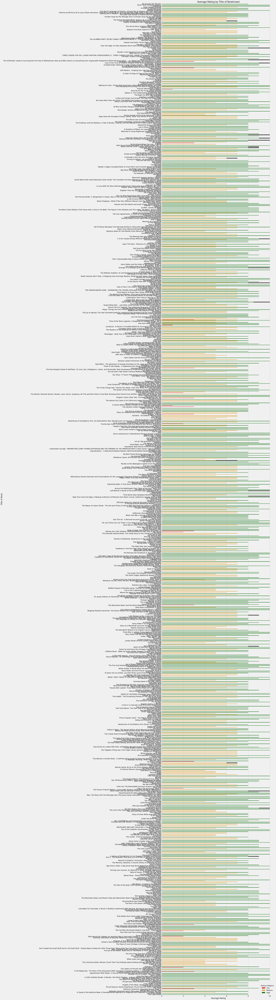

In [41]:
sample_size = 1000
df3 = final_df.sample(n=sample_size, random_state=42)


df3['Rating_Category'] = pd.cut(df3['Book-Rating'], bins=[0, 3, 7, 10], labels=['Low', 'Medium', 'High'])

# Plotting bar plot dengan seaborn
plt.figure(figsize=(16, 150))
sns.barplot(data=df3, x='Book-Rating', y='Book-Title', hue='Rating_Category', palette={'Low': 'red', 'Medium': 'orange', 'High': 'green'})
plt.title('Average Rating by Title of Book(new)')
plt.xlabel('Average Rating')
plt.ylabel('Title of Book')
plt.legend(title='Rating Category')
plt.show()

In [42]:
final_df.describe()

,Year-Of-Publication,User-ID,Book-Rating,Age
count,263865.00000,263865.000000,263865.000000,263865.000000
mean,1970.15099,130141.614970,7.660125,36.089713
std,226.50293,84266.370984,1.813002,11.550054
min,0.00000,8.000000,1.000000,0.000000
25%,1993.00000,51440.000000,7.000000,31.000000
50%,1998.00000,126006.000000,8.000000,35.000000
75%,2001.00000,205280.000000,9.000000,39.000000
max,2050.00000,279858.000000,10.000000,244.000000


First identify and mark outliers (greater than 2022 or equal to 0) in the 'Year-Of-Publication' field as missing values. 
The average of the 'Year-Of-Publication' field in books_df is then used to populate the missing value of that field in final_df. 
Finally, the populated value is converted to an integer.

In [43]:
import numpy as np
final_df.loc[(final_df["Year-Of-Publication"] > 2022) | (final_df["Year-Of-Publication"] == 0), 'Year-Of-Publication'] = np.nan
final_df.loc[:, "Year-Of-Publication"] = final_df["Year-Of-Publication"].fillna(round(books_df["Year-Of-Publication"].mean())).astype(np.int32)

Then identify and mark outliers in the 'Age' field (greater than 90 years old or less than 5 years old) as missing values. 
The average value of the 'Age' field in users_df is then used to populate the missing value of that field in final_df. 
Finally, the data types of the 'Age' and 'Year-Of-Publication' fields are converted to 32-bit integers

In [44]:
final_df.loc[(final_df.Age > 90) | (final_df.Age < 5), 'Age'] = np.nan

#replacing NaNs with mean
final_df.Age = final_df.Age.fillna(users_df.Age.mean())

#setting the data type as int
final_df.Age = final_df.Age.astype(np.int32)
final_df['Year-Of-Publication'] = final_df['Year-Of-Publication'].astype(np.int32)

In [45]:
new_user_data = {'User-ID': 279858, 'Location': "Kensington, NSW, Australia", 'Age': 38}

# Append the new user to the DataFrame
users = pd.concat([users_df, pd.DataFrame([new_user_data])], ignore_index=True)

# List of ISBNs to be rated by the new user
isbn_list = [
    '0425176428', '0385418493', '0871137380', '0486265862', '0060973129',
    '0029087104', '0553256696', '0393038440', '0345308239', '0131337033', 
]

# Generate random high ratings (6-10)
ratings_list = np.random.randint(6, 11, size=len(isbn_list))

# Create new user ratings
new_user_ratings = [{'User-ID': 279858, 'ISBN': isbn, 'Book-Rating': rating} for isbn, rating in zip(isbn_list, ratings_list)]

ratings = pd.concat([ratings, pd.DataFrame(new_user_ratings)], ignore_index=True)

In [46]:
final_df.describe()

,Year-Of-Publication,User-ID,Book-Rating,Age
count,263865.000000,263865.000000,263865.000000,263865.000000
mean,1995.717738,130141.614970,7.660125,35.919364
std,7.881883,84266.370984,1.813002,10.100039
min,1904.000000,8.000000,1.000000,5.000000
25%,1993.000000,51440.000000,7.000000,31.000000
50%,1998.000000,126006.000000,8.000000,35.000000
75%,2001.000000,205280.000000,9.000000,39.000000
max,2020.000000,279858.000000,10.000000,90.000000


### Content-based recommend

Data preparation: 

First, the 'Book-Title', 'Book-Author', 'Description', and 'Categories' columns in books_df are concatenated into a text corpus. 
Using Gensim's Word2Vec model, a word vector model word2vec_model_recommender is obtained after training in corpus. 

In [47]:
corpus = (books_df['Book-Title'].astype(str) + ' ' + 
          books_df['Book-Author'].astype(str) + ' ' +
          books_df['Description'].astype(str) + ' ' +
          books_df['Categories'].astype(str)).apply(str.split).tolist()

**Recommended algorithm Word2Vec:**
- The recommend function is the core of the recommendation algorithm. 
- The input parameters are the user ID user_id, the complete book data, and the trained Word2Vec model word2vec_model. 
- First get the user's favorite book information, including title, author, category, and description. 
- This information is spliced into a text and divided into words to obtain an average word vector avg_vector. 
- Then the average word vector of each book is calculated, and the cosine similarity is calculated with the average word vector of the  user, and the similarity score is obtained. 
- According to the similarity score, the top 10 books with the highest similarity and scores higher than 5 are selected as the recommended results. 
- Finally, the recommendation result is returned in DataFrame format. 

In [48]:
from gensim.models import Word2Vec
from sklearn.metrics.pairwise import cosine_similarity
word2vec_model_recommender = Word2Vec(sentences=corpus, vector_size=500, window=5, min_count=5, sg=2)

def recommend(user_id, data, word2vec_model):
    # Get user preferences
    user_preferences = data[data['User-ID'] == user_id]
    if user_preferences.empty:
        return None

    # Get information about your favorite books
    liked_books = user_preferences['Book-Title'].tolist()
    liked_authors = user_preferences['Book-Author'].tolist()
    liked_genres = user_preferences['Categories'].tolist()
    liked_description = user_preferences['Description'].tolist()

    # Merge user preference information
    text = ' '.join(liked_books + liked_authors + liked_genres + liked_description)
    
    # Divide the text into words
    tokens = text.split()
    
    # Get text vector
    vectors = [word2vec_model.wv[token] for token in tokens if token in word2vec_model.wv]
    if len(vectors) == 0:
        return None
    avg_vector = sum(vectors) / len(vectors)

    # Calculate the similarity to each book
    similarities = []
    recommended_titles = set()
    for idx, row in data.iterrows():
        row_text = ' '.join([str(row[col]) for col in data.columns])
        row_tokens = row_text.split()
        row_vectors = [word2vec_model.wv[token] for token in row_tokens if token in word2vec_model.wv]
        if len(row_vectors) > 0:
            row_avg_vector = sum(row_vectors) / len(row_vectors)
            similarity = cosine_similarity([avg_vector], [row_avg_vector])[0][0]
            similarities.append((row, similarity))

    # Rank the similarity and select the top 10 recommendations
    similarities.sort(key=lambda x: x[1], reverse=True)
    recommendations = []
    for book, sim in similarities:
        if book['Book-Title'] not in recommended_titles and book['Book-Rating'] > 5:
            recommendations.append(book.to_dict())
            recommended_titles.add(book['Book-Title'])
        if len(recommendations) >= 10:
            break

    # Convert the recommendation result to a DataFrame
    recommendations_df = pd.DataFrame(recommendations)

    return recommendations_df

user_id = 279858
recommendations = recommend(user_id, final_df, word2vec_model_recommender)
print(recommendations)

         ISBN                                         Book-Title  \
0  0312243359  We Wish to Inform You That Tomorrow We Will be...   
1  0393038440  God's Chinese Son: The Taiping Heavenly Kingdo...   
2  0425166872       Red Azalea : Berkley Trade Signature Edition   
3  0486235009           The Discovery of the Tomb of Tutankhamen   
4  0385418493  How the Irish Saved Civilization: The Untold S...   
5  0060505265  The Sewing Circles of Herat : A Personal Voyag...   
6  1400060648  The Bone Woman : A Forensic Anthropologist's S...   
7  0385494785  Into Thin Air : A Personal Account of the Mt. ...   
8  1400032806  Under the Banner of Heaven : A Story of Violen...   
9  0375708278  Isaac's Storm: A Man, a Time, and the Deadlies...   

          Book-Author  Year-Of-Publication                   Publisher  \
0   Philip Gourevitch                 1999                 Picador USA   
1  Jonathan D. Spence                 1996  W. W. Norton &amp; Company   
2          Anchee Min        

**Conclusion:**

This Word2VeC-based recommendation algorithm uses the text information of books (title, author, description, and category) to capture semantic correlations between books by learning word vectors. When the user likes some books, the system can find similar books to recommend according to the characteristics of these books. This approach can provide more personalized and semantically relevant recommendations, with better performance compared to simple popularity-based or collaborative filtering recommendation algorithms.

**Data Preprocessing**

Splicing the 'Book Title', 'Book Author', 'Description' and 'Categories' columns in' final_df 'into a large text corpus. 
Use 'TfidfVectorizer' to extract TF-IDF features from 'corpus' and generate tfidf_matrix.

**Recommendation Algorithm**:
- The 'recommend' function accepts the user ID and the entire dataset 'final_df' as input. 
- First, get the user's favorite book list 'user_preferences'. 
- Then, generate the user preference vector user_vector according to user_preferences. 
- Next, traverse the entire data set, calculating the cosine similarity between each book and the user's preference vector, and store the results in the similarities list. 
- Sorts the similarities list in descending order of similarity. 
- From the similarities list after sorting, select books that the first 10 users are not familiar with, score more than 5 points, and do not repeat as the recommendation results. 
- Finally, the recommendation result is returned in DataFrame format. 

In [49]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

corpus = (books_df['Book-Title'].astype(str) + ' ' + 
          books_df['Book-Author'].astype(str) + ' ' +
          books_df['Description'].astype(str) + ' ' +
          books_df['Categories'].astype(str)).tolist()

tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(corpus)

def recommend(user_id, data):
    # Get user preferences
    user_preferences = final_df.loc[final_df['User-ID'] == user_id, 'Book-Title'].tolist()
    
    # Create a user preference vector
    user_vector = tfidf_vectorizer.transform([' '.join(user_preferences)])
    
    # Calculate how similar each book is to user preferences
    similarities = []
    for idx, row in data.iterrows():
        row_text = ' '.join([str(row[col]) for col in data.columns])
        row_vector = tfidf_vectorizer.transform([row_text])
        similarity = cosine_similarity(user_vector, row_vector)[0][0]
        similarities.append((row, similarity))
    
    # Sort in descending order of similarity
    similarities.sort(key=lambda x: x[1], reverse=True)

    # Get the top 10 recommendations
    recommendations = []
    recommended_titles = set()
    for book, sim in similarities:
        if book['Book-Title'] not in user_preferences and book['Book-Rating'] > 5 and book['Book-Title'] not in recommended_titles:
            recommendations.append(book.to_dict())
            recommended_titles.add(book['Book-Title'])
        if len(recommendations) >= 10:
            break
    
    # Convert to a DataFrame
    recommendations_df = pd.DataFrame(recommendations)

    return recommendations_df

user_id = 279858
recommendations = recommend(user_id, final_df)
recommendations

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Description,Categories,Language,openlibrary_Description,openlibrary_Categories,openlibrary_Language,User-ID,Book-Rating,Location,Age
0,0385418485,How the Irish Saved Civilization: The Untold S...,Thomas Cahill,1995,Nan A. Talese,This narrative tells the story of how Europe e...,Art,en,From the fall of Rome to the rise of Charlemag...,"Learning and scholarship, Classical Civilizati...",English,218615,9,"snoqualmie, washington, usa",35
1,0553109200,The Years of Rice and Salt,KIM STANLEY ROBINSON,2002,Bantam,With the incomparable vision and breathtaking ...,Fiction,en,With the incomparable vision and breathtaking ...,"Fiction, Black Death, Science Fiction, Long No...",English,153669,8,"long beach, california, usa",45
2,0060922834,Modern Times: The World from the Twenties to t...,Paul Johnson,1992,Perennial,Originally published in 1983 and named one of ...,"History, Modern",en,"The classic world history of the events, ideas...","Modern History, History, Nonfiction, Weltgesch...",English,33865,9,"nashville, tennessee, usa",25
3,0385476973,The Great Shame: And the Triumph of the Irish ...,Thomas Keneally,1999,Doubleday Books,"In the nineteenth century, Ireland lost 50 per...",History,en,"""In the nineteenth century, Ireland lost half ...","19th century, Australia, Civilization, Civiliz...",English,219321,8,"marshfield, massachusetts, usa",35
4,8420618225,La Republica Romana,Isaac Asimov,1993,Alianza,If western civilization looks to ancient Greec...,Rome,es,If western civilization looks to ancient Greec...,"Juvenile literature, History, Rome -- History ...",Spanish,39467,8,"barcelona, catalunya, spain",35
5,0345384563,"A History of God: The 4,000-Year Quest of Juda...",Karen Armstrong,1994,Ballantine Books,Why does God exist? How have the three dominan...,Religion,en,"As soon as they became recognizably human, men...","Biblical teaching, Comparative studies, Dios, ...",English,63956,9,"emporia, kansas, usa",28
6,0385482493,The Gifts of the Jews : How a Tribe of Desert ...,Thomas Cahill,1999,Anchor,NATIONAL BESTSELLER • The author of the runawa...,History,en,The author of the runaway bestseller How the I...,"Bible, Civilization, History, History of Bibli...",English,120347,6,"st-narcisse, ,",35
7,0060974680,Europe : A History,Norman Davies,1998,Perennial,Here is a masterpiece of historical narrative ...,History,en,Not found,"Histoire, History, Europe",English,23902,10,"london, england, united kingdom",35
8,0804100039,If You Survive: From Normandy to the Battle of...,George Wilson,1987,Ballantine Books,"""If you survive your first day, I'll promote y...",History,en,first hand account of platoon leader with 4th ...,"Personal narratives, World War, 1939-1945, war...",English,2954,6,"wichita, kansas, usa",71
9,0553108301,The End of War: A Novel of the Race for Berlin,David L. Robbins,2000,Bantam Books,"Berlin, January 1945 The war draws to a close,...",Berlin (Germany),en,Not found,"Fiction, World War, 1939-1945, History, World ...",English,274423,8,"creswell, oregon, usa",35
